# Eigen faces and regeneration

In this notebook, we would analyze the olivetti faces (dataset available publicly, lately incorporated in sklearn). We would randomly split the dataset into train and test, create Eigen faces and mean face from training data and we would then try to regenerate the train and test faces using mean and Eigen faces.

In [114]:
# Import library / packages

# For numerical operation
import numpy as np

# For plots
from matplotlib import pyplot as plt

# Train-test split
from sklearn.model_selection import train_test_split

# For PCA
from sklearn.decomposition import PCA


In [115]:
# Load the faces
faces_image = np.load('Faces\\olivetti_faces.npy')
faces_target = np.load('Faces\\olivetti_faces_target.npy')

# Find the dimension
faces_image.shape, faces_target.shape

((400, 64, 64), (400,))

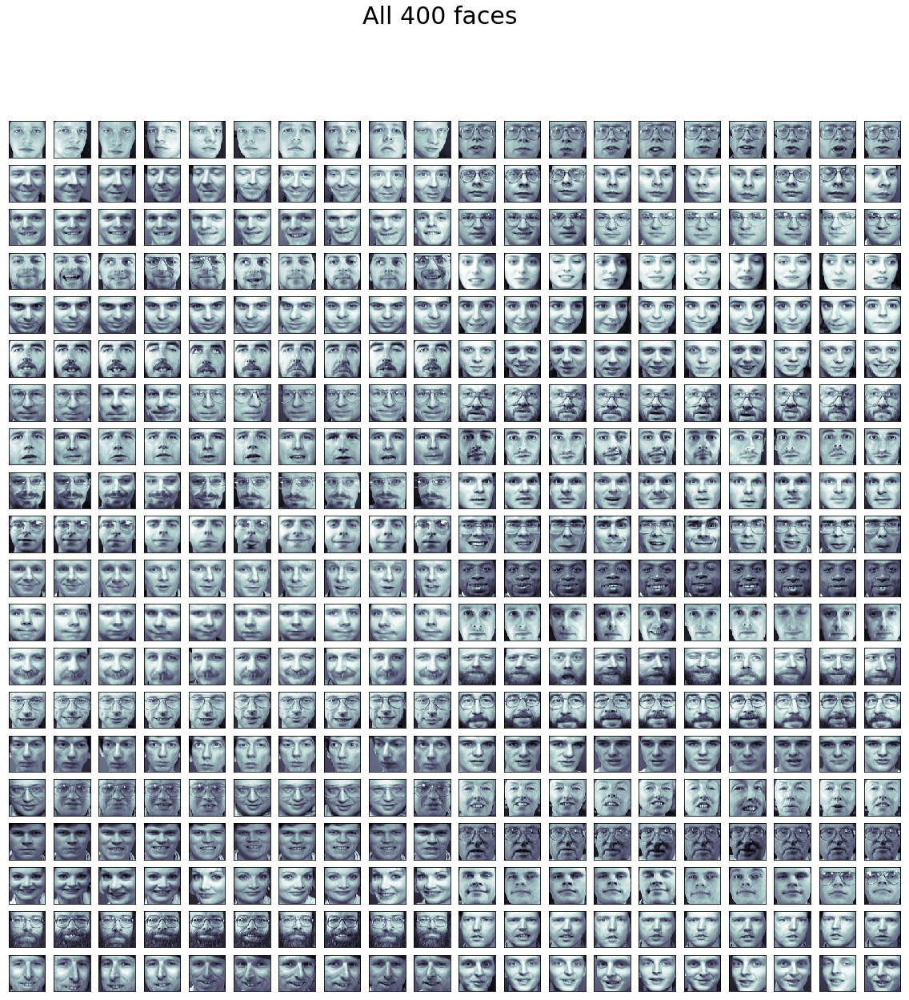

In [116]:
# View all the 400 faces
fig, axes = plt.subplots(20,20,figsize=(20,20),\
                        subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('All 400 faces', fontsize = 30)

for i, ax in enumerate(axes.flat) :
    ax.imshow(faces_image[i,:,:].reshape(64,64), cmap = 'bone')

## Stratified train-test split
The split should be stratified for accurate test results. Stratified split ensures that data from each class/category of dataset are distributed between train and test based on the size defined.

In [117]:
# Split the train and test images
faceimg_train, faceimg_test, facetrg_train, facetrg_test = train_test_split(faces_image, faces_target,\
                                                    stratify = faces_target, test_size = 0.30)

# Mirror faces

Larger training set reduce overfitting since model to predict the class will have lot more faces to train however it is also important to NOT include any form of test data in training dataset. Hence we will create mirror faces of training dataset and add them in training data. This has improved to bring the test accuracy up.

In [118]:
# Produce mirror faces of all training dataset and add
Transform_mat = np.flip(np.diagflat(np.ones(faceimg_train.shape[1])),1)

def Mirror_face(X) :
    return(np.dot(X,Transform_mat))

for i, face in enumerate(faceimg_train) :
    New_face = Mirror_face(face).reshape(1,face.shape[0], face.shape[1])
    faceimg_train = np.append(faceimg_train,New_face, axis=0)
    facetrg_train = np.append(facetrg_train, facetrg_train[i])


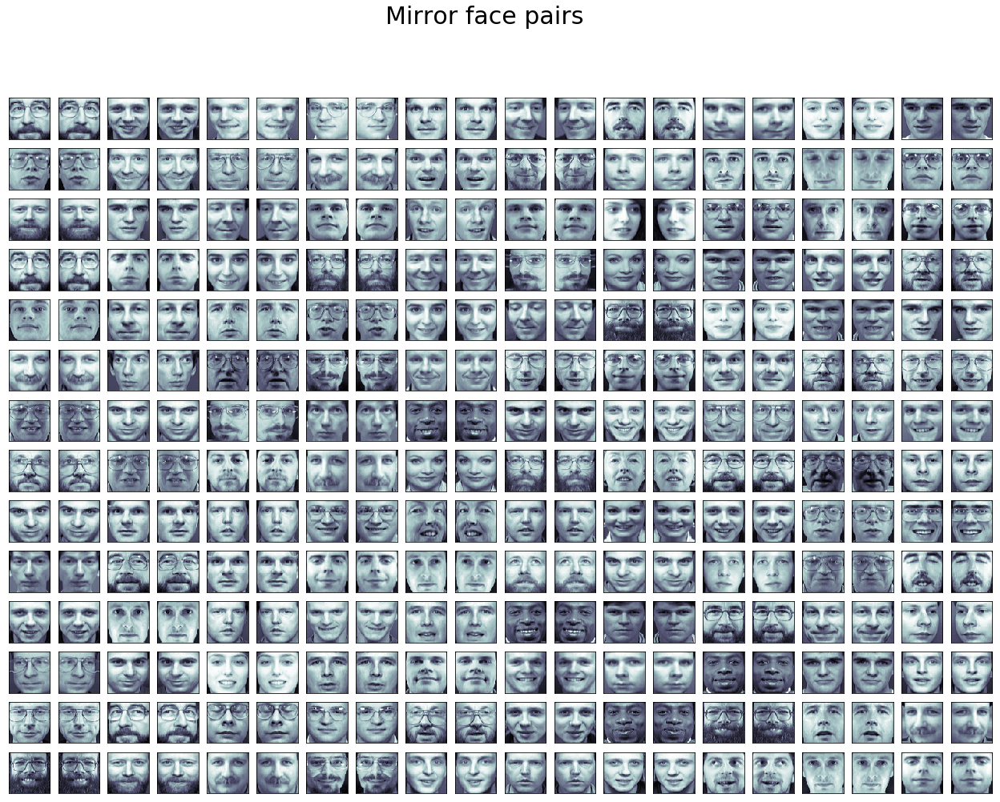

In [119]:
# View few mirror faces from training data
fig, axes = plt.subplots(14,20,figsize=(22,16),\
                        subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('Mirror face pairs', fontsize = 30)

totface = faceimg_train.shape[0]

for i, ax in enumerate(axes.flat) :
    if (i % 2 ) == 0 :
        ax.imshow(faceimg_train[int(i/2),:,:].reshape(64,64), cmap = 'bone')
    else :
        ax.imshow(faceimg_train[int((i-1 + totface)/2),:,:].reshape(64,64), cmap = 'bone')

In [120]:
# Flatten all images
X_train = faceimg_train.reshape(faceimg_train.shape[0],-1)
X_test = faceimg_test.reshape(faceimg_test.shape[0],-1)
Y_train = facetrg_train.reshape(-1,1) 
Y_test = facetrg_test.reshape(-1,1)

## Principal component Analysis (PCA) on training data

In [121]:
# Find all Principal Components
max_features = 200
pca = PCA(n_components=max_features)
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=200, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

# Eigen face from training data

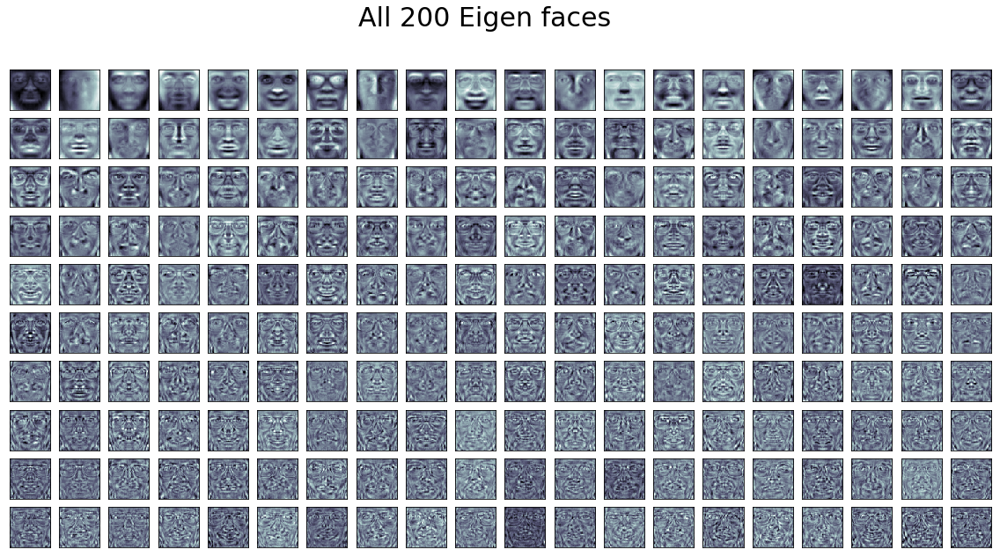

In [122]:
# View all the 200 Eigen faces
fig, axes = plt.subplots(10,20,figsize=(20,10),\
                        subplot_kw = {'xticks':[],'yticks':[]})

plt.suptitle('All 200 Eigen faces', fontsize = 30)

for i, ax in enumerate(axes.flat) :
    ax.imshow(pca.components_[i,:].reshape(64,64), cmap = 'bone')

In [123]:
# Extract other informations
Eigen_val = pca.explained_variance_
Eigen_vec = pca.components_
Weight_train = pca.transform(X_train)
Weight_test = pca.transform(X_test)
Mean_face = pca.mean_

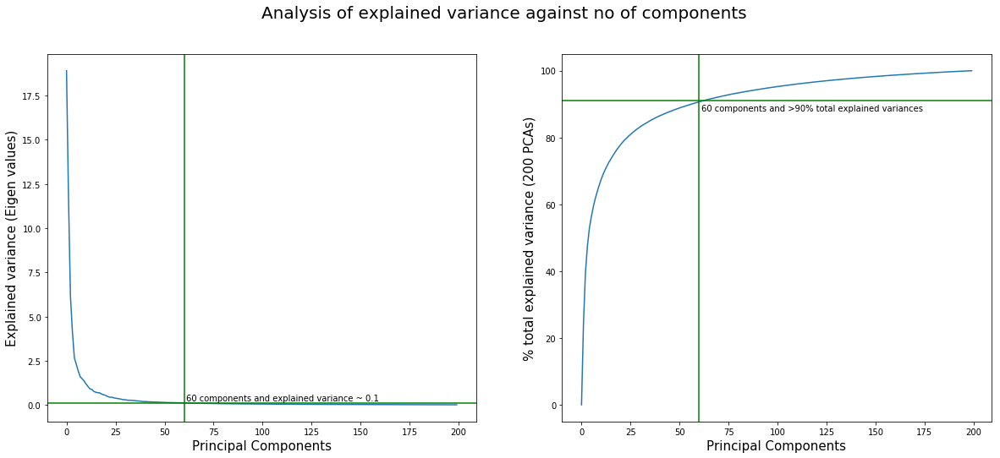

In [124]:
# Plot of Eigen values for each components
fig, axes = plt.subplots(1,2, figsize = (20,8))

axes[0].plot(Eigen_val)
axes[0].axvline(x=60, color = 'green')
axes[0].axhline(y=0.12, color = 'green')
axes[0].set_xlabel('Principal Components', fontsize=15)
axes[0].set_ylabel('Explained variance (Eigen values)', fontsize=15)
axes[0].text(61,0.25, '60 components and explained variance ~ 0.1')

x = np.array([np.sum(Eigen_val[0:i])*100/np.sum(Eigen_val) for i in range(len(Eigen_val))])
axes[1].plot(x)
axes[1].axvline(x=60, color = 'green')
axes[1].axhline(y=91, color = 'green')
axes[1].set_xlabel('Principal Components', fontsize=15)
axes[1].set_ylabel('% total explained variance (200 PCAs)', fontsize=15)
axes[1].text(61,88, '60 components and >90% total explained variances')

plt.suptitle('Analysis of explained variance against no of components', fontsize=20)
plt.show()

# Regenerated faces using Eigen faces

In [125]:
# Regenerate some random faces
def show_regenerated_faces(X, Weights,cat) :
    
    fig, axes = plt.subplots(20,20,figsize=(22,22),\
                            subplot_kw = {'xticks':[],'yticks':[]})

    plt.suptitle('Original, Mean and regenerated face using Eigen faces - ' + cat, fontsize = 30)

    random_faces = np.random.choice(Weights.shape[0],20)

    for i, ax in enumerate(axes.flat) :
        j = random_faces[int(i / 20)]
        if (i % 20 ) == 0 :
            ax.imshow(X[j,:].reshape(64,64), cmap = 'bone')
            if int(i / 20) == 19 :
                ax.set_xlabel('Original')
            elif int(i / 20) == 0 :
                ax.set_title('Original')
        elif (i % 20 ) == 1 :
            ax.imshow(Mean_face.reshape(64,64), cmap = 'bone')
            if int(i / 20) == 19 :
                ax.set_xlabel('Mean')
            elif int(i / 20) == 0 :
                ax.set_title('Mean')
        elif (i % 20 ) > 1 :
            k = 5*((i % 20)-1)
            face = Mean_face.reshape(1,-1) + np.dot(Weights[j,0:k],Eigen_vec[0:k,:])
            ax.imshow(face.reshape(64,64), cmap = 'bone')
            if int(i / 20) == 19 :
                ax.set_xlabel(str(k)+' Eigens')
            elif int(i / 20) == 0 : 
                ax.set_title(str(k)+' Eigens')
        
    

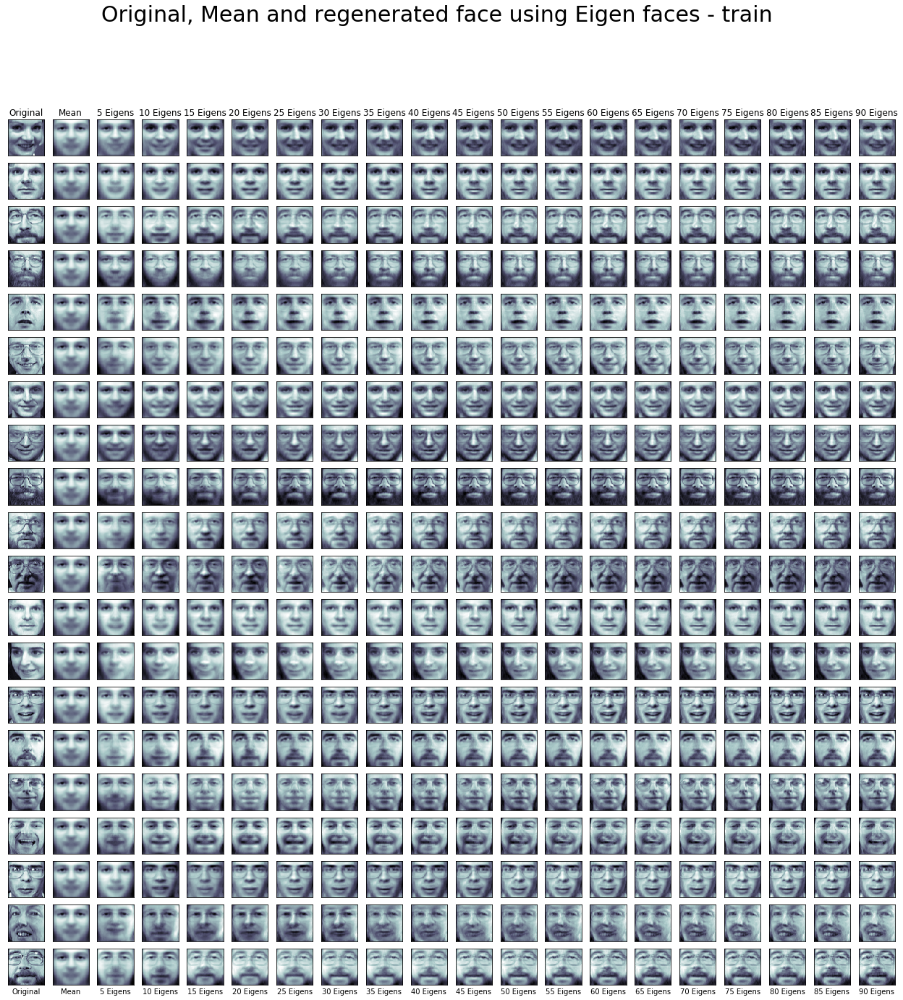

In [126]:
# Regenerated train faces
show_regenerated_faces(X_train, Weight_train, 'train')

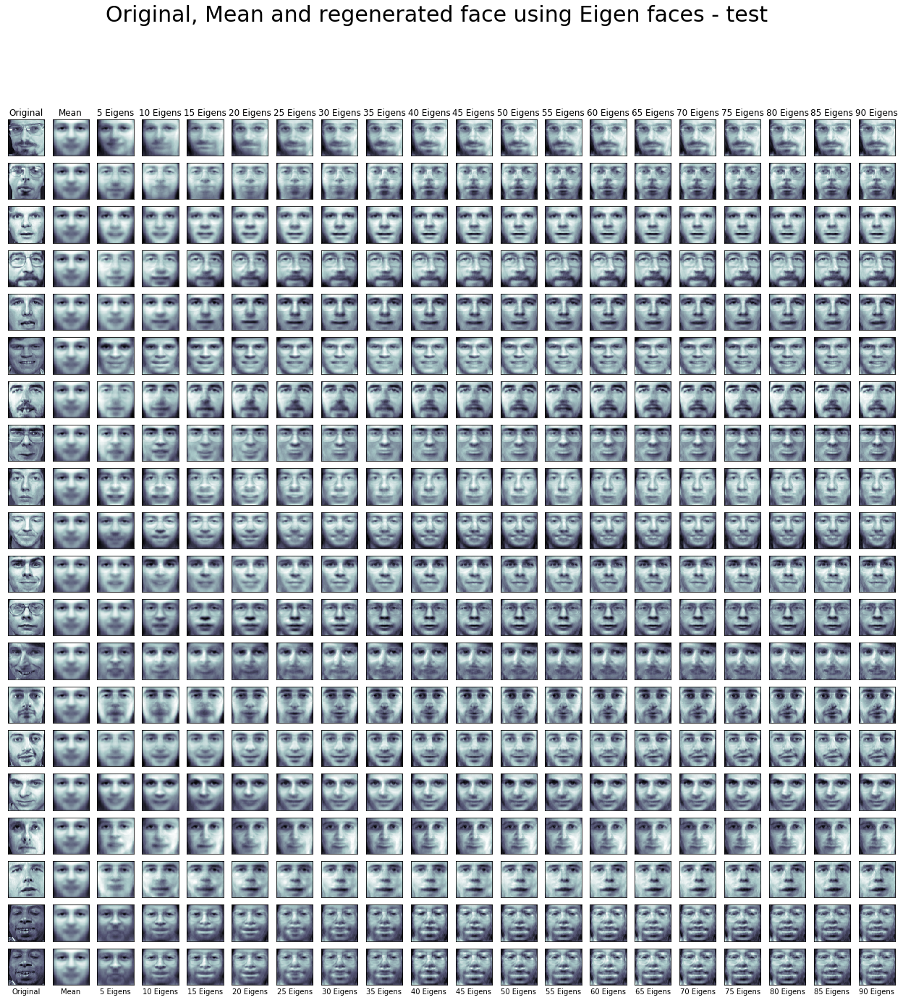

In [127]:
# Regenerated test faces
show_regenerated_faces(X_test, Weight_test, 'test')

As you would see from train and test dataset - Approx 60 (as few as) Eigen faces/weights (out of 4096) helps us regenerate a face quite close to original face. This is tremendous reduction in size due to PCA !!

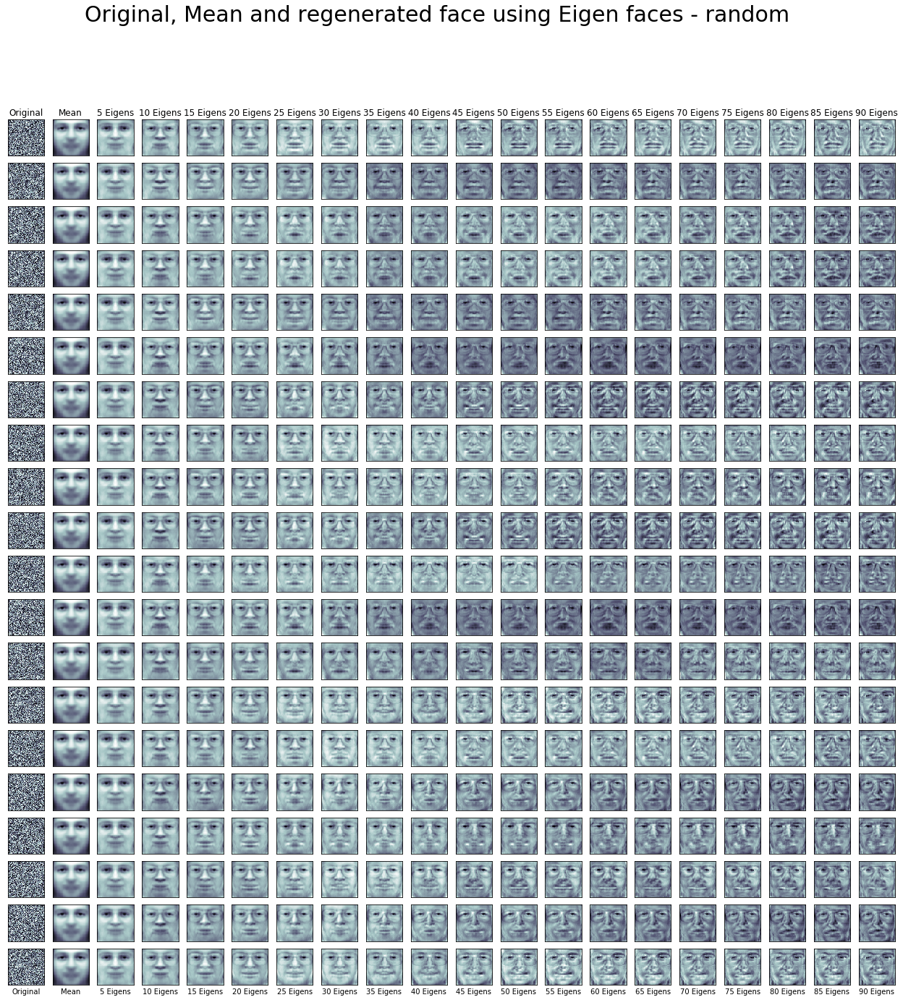

In [128]:
# Pick some random numbers and generate 20 images and then find its PCA and Eigen faces
Random_face = np.random.random([20,64,64])
Weight_random = pca.transform(Random_face.reshape(20,-1))
show_regenerated_faces(Random_face.reshape(20,-1), Weight_random, 'random')

You would see that image having random noice is developed into some face with 60 Eigens which is NOT correct. And this is a drawback of only considering the weights. Ideally we can regenerate faces only if it the face falls in the distribution used for training and our test images are but the random images are NOT.

## Save the data

In [129]:
# Let's save the data
np.save("Result01\X_train.npy", X_train)
np.save("Result01\X_test.npy", X_test)
np.save("Result01\Y_train.npy", Y_train)
np.save("Result01\Y_test.npy", Y_test)
np.save("Result01\Weight_train.npy", Weight_train)
np.save("Result01\Weight_test.npy", Weight_test)
np.save("Result01\Eigen_val.npy", Eigen_val)
np.save("Result01\Eigen_vec.npy", Eigen_vec)
np.save("Result01\Mean_face.npy", Mean_face)


# Summary

We have split the faces we have into train and test (stratified split), and generated PCA using train dataset. Using the PCA components , we can regenerate the faces back with as few as 60 weights only however the face to be regenerated should fall in the distribution of the training set.

Question is how do we know a regenerated face is a known face. We will see this and much more like modelling in a separate notebook.